# Advanced Certification Programme in AI and MLOps
## A programme by IISc and TalentSprint
### Mini Project Notebook: Employee Attrition Prediction

## Problem Statement

To predict employee attrition using CatBoost and XgBoost

## Learning Objectives

At the end of the experiment, you will be able to

* explore the employee attrition dataset
* apply CatBoost and XgBoost on the dataset
* tune the model hyperparameters to improve accuracy
* evaluate the model using suitable metrics


## Introduction

Employee attrition is the gradual reduction in employee numbers. Employee attrition happens when the size of your workforce diminishes over time. This means that employees are leaving faster than they are hired. Employee attrition happens when employees retire, resign, or simply aren't replaced.
Although employee attrition can be company-wide, it may also be confined to specific parts of a business.

Employee attrition can happen for several reasons. These include unhappiness about employee benefits or the pay structure, a lack of employee development opportunities, and even poor conditions in the workplace.

To know more about the factors that lead to employee attrition, refer [here](https://www.betterup.com/blog/employee-attrition#:~:text=Employee%20attrition%20is%20the%20gradual,or%20simply%20aren't%20replaced).


**Gradient Boosted Decision Trees**

* Gradient boosted decision trees (GBDTs) are one of the most important machine learning models.

* GBDTs originate from AdaBoost, an algorithm that ensembles weak learners and uses the majority vote, weighted by their individual accuracy, to solve binary classification problems. The weak learners in this case are decision trees with a single split, called decision stumps.

* Some of the widely used gradient boosted decision trees are XgBoost, CatBoost and LightGBM.

## Dataset

The dataset used for this mini-project is [HR Employee Attrition dataset](https://data.world/aaizemberg/hr-employee-attrition). This dataset is synthetically created by IBM data scientists. There are 35 features and 1470 records.

There are numerical features such as:

* Age
* DistanceFromHome
* EmployeeNumber
* PerformanceRating

There are several categorical features such as:
* JobRole
* EducationField
* Department
* BusinessTravel

Dependent or target feature is 'attrition' which has values as Yes/No.

In [ ]:
#@title Download the data
!wget -qq https://cdn.iisc.talentsprint.com/CDS/Datasets/wa_fn_usec_hr_employee_attrition_tsv.csv
print("Data Downloaded Successfuly!!")

Data Downloaded Successfuly!!


## Grading = 10 Points

### Install Required Dependencies

In [ ]:
# Install CatBoost
!pip -qq install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 3.3 MB/s eta 0:00:00


### Import Required Packages

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier, metrics
import warnings
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', 100)
%matplotlib inline

Please refer to the [ReadMe](https://drive.google.com/file/d/1V5CAUlRwLNcQcIWfgCJhukYvRESi2cC2/view?usp=sharing) before proceeding further.

# Part-A

## Load the Dataset

**Exercise 1: Read the dataset [0.5 Mark]**

**Hint:** pd.read_csv()

In [ ]:
# read the dataset
hr_df = pd.read_csv(r'wa_fn_usec_hr_employee_attrition_tsv.csv')

In [ ]:
# Check the shape of dataframe.
hr_df.shape

(1470, 35)

## Data Exploration

- Check for missing values
- Check for features having consistent data across samples
- Check for outliers or inconsistencies in data columns
- Check for correlated features
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships? Making correlation heatmaps makes it easy to identify possible collinearity

**Exercise 2: Create a `List` of numerical and categorical columns. Display a statistical description of the dataset. Remove missing values (if any) [0.5 Mark]**

**Hint:**
>Use `for` to iterate through each column.

>For statistical description display - samples count, missing values count, range, and data type of each feature.

In [ ]:
# categorical_col = [col for col in hr_df.columns if hr_df[col].dtype == 'O']
# numerical_col = [col for col in hr_df.columns if col not in categorical_col]

numerical_col = hr_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_col = hr_df.select_dtypes(include='object').columns.tolist()

for col in hr_df.columns:
    if hr_df[col].dtype != 'O':
        samples_count = len(hr_df)
        missing_values_count = hr_df[col].isnull().sum()
        min, max = hr_df[col].min(), hr_df[col].max()
        print(f'sample count: {len(hr_df)}, missing_values_count: {missing_values_count}, range: {min, max}, data type: {hr_df[col].dtype}, {col}')
    else:
        samples_count = len(hr_df)
        missing_values_count = hr_df[col].isnull().sum()
        min, max = 'na', 'na'
        print(f'sample count: {len(hr_df)}, missing_values_count: {missing_values_count}, range: {min, max}, data type: {hr_df[col].dtype}, {col}')


sample count: 1470, missing_values_count: 0, range: (18, 60), data type: int64, age
sample count: 1470, missing_values_count: 0, range: ('na', 'na'), data type: object, attrition
sample count: 1470, missing_values_count: 0, range: ('na', 'na'), data type: object, businesstravel
sample count: 1470, missing_values_count: 0, range: (102, 1499), data type: int64, dailyrate
sample count: 1470, missing_values_count: 0, range: ('na', 'na'), data type: object, department
sample count: 1470, missing_values_count: 0, range: (1, 29), data type: int64, distancefromhome
sample count: 1470, missing_values_count: 0, range: (1, 5), data type: int64, education
sample count: 1470, missing_values_count: 0, range: ('na', 'na'), data type: object, educationfield
sample count: 1470, missing_values_count: 0, range: (1, 1), data type: int64, employeecount
sample count: 1470, missing_values_count: 0, range: (1, 2068), data type: int64, employeenumber
sample count: 1470, missing_values_count: 0, range: (1, 4), 

First, we want to get a sense of our data:
- What features have the most divergent distributions based on target class
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships, making correlation heatmaps makes it easy to identify possible colinearity

### Check for outliers

**Exercise 3: Create a box plot to check for outliers [0.5 Mark]**

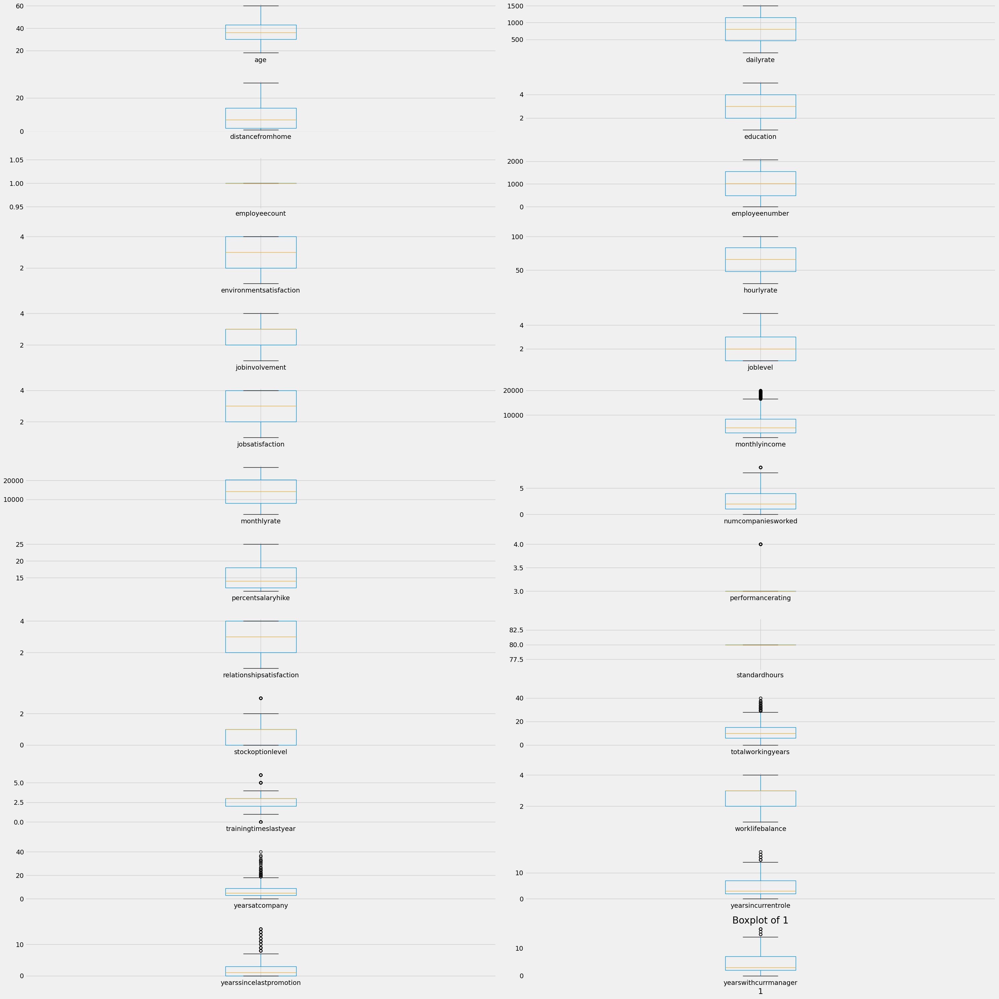

In [ ]:
# Check for outliers
import math
# palette = sns.color_palette("tab10", len(numerical_col))

# for col, color in zip(numerical_col, palette):
#     plt.figure(figsize=(5, 3))
#     # fig, axes = plt.subplots(1,2,figsize= (9,3))
#     sns.boxplot(hr_df[col], color= color)
#     plt.xlabel(col)
#     plt.title(f'Boxplot of {col}')
#     plt.grid(False)
#     plt.show()

plot_columns = 2
fig, ax = plt.subplots(13, plot_columns, figsize=(30, 30))
for idx, feature in enumerate(numerical_col):
    col = idx%plot_columns
    row = math.floor(idx/plot_columns)
    hr_df.boxplot(column=feature, ax = ax[row][col])
    plt.xlabel(col)
    plt.title(f'Boxplot of {col}')
    plt.grid(False)
plt.tight_layout()

### Handling outliers

**Exercise 4: Use lower bound as 25% and upper bound as 75% to handle the outliers [0.5 Mark]**

In [ ]:
# YOUR CODE HERE
# def remove_outliers(column):
#     lower_bound = column.quantile(0.25)
#     upper_bound = column.quantile(0.75)
#     return column[(column >= lower_bound) & (column <= upper_bound)]

# temp_df = hr_df.copy()
# temp_df = temp_df[numerical_col].apply(remove_outliers)

lower_bound = 0.25
upper_bound = 0.75

# Calculate the percentile values for each feature
lower_percentiles = hr_df[numerical_col].quantile(lower_bound)
upper_percentiles = hr_df[numerical_col].quantile(upper_bound)

# Replace values below the lower bound with the lower bound and above the upper bound with the upper bound
# Now 'trimmed_data' contains the dataset with outliers handled by trimming
trimmed_data = hr_df.clip(lower=lower_percentiles, upper=upper_percentiles, axis=1)

#final data contains categorical values retained and numerical values with outlier treatment.
final_data = pd.concat([trimmed_data.select_dtypes(include=['number']), hr_df.select_dtypes(exclude=['number'])], axis=1)

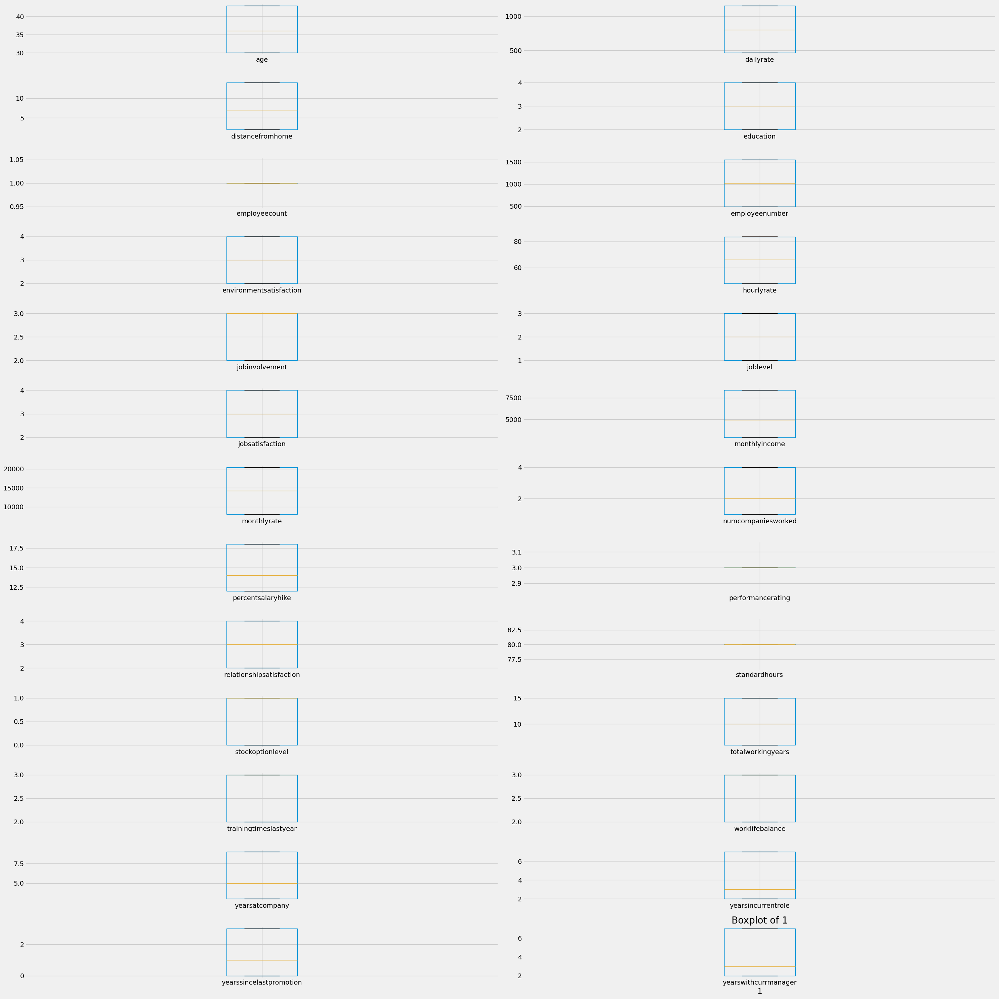

In [ ]:
# Recheck for outliers
# palette = sns.color_palette("tab10", len(numerical_col))

# for col, color in zip(numerical_col, palette):
#     plt.figure(figsize=(5, 3))
#     # fig, axes = plt.subplots(1,2,figsize= (9,3))
#     sns.boxplot(temp_df[col], color= color)
#     plt.xlabel(col)
#     plt.title(f'Boxplot of {col}')
#     plt.grid(False)
#     plt.show()

plot_columns = 2
fig, ax = plt.subplots(13, plot_columns, figsize=(30, 30))
for idx, feature in enumerate(numerical_col):
    col = idx%plot_columns
    row = math.floor(idx/plot_columns)
    final_data.boxplot(column=feature, ax = ax[row][col])
    plt.xlabel(col)
    plt.title(f'Boxplot of {col}')
    plt.grid(False)
plt.tight_layout()

In [ ]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       1470 non-null   int64  
 1   dailyrate                 1470 non-null   int64  
 2   distancefromhome          1470 non-null   int64  
 3   education                 1470 non-null   int64  
 4   employeecount             1470 non-null   int64  
 5   employeenumber            1470 non-null   float64
 6   environmentsatisfaction   1470 non-null   int64  
 7   hourlyrate                1470 non-null   float64
 8   jobinvolvement            1470 non-null   int64  
 9   joblevel                  1470 non-null   int64  
 10  jobsatisfaction           1470 non-null   int64  
 11  monthlyincome             1470 non-null   int64  
 12  monthlyrate               1470 non-null   float64
 13  numcompaniesworked        1470 non-null   int64  
 14  percents

### Target label imbalance

**Exercise 5: Check if there is an imbalance in target label [0.5 Mark]**

**Hint:** Use value_counts()

In [ ]:
# Count of unique values in Attrition column
hr_df['attrition'].value_counts()

attrition
No     1233
Yes     237
Name: count, dtype: int64

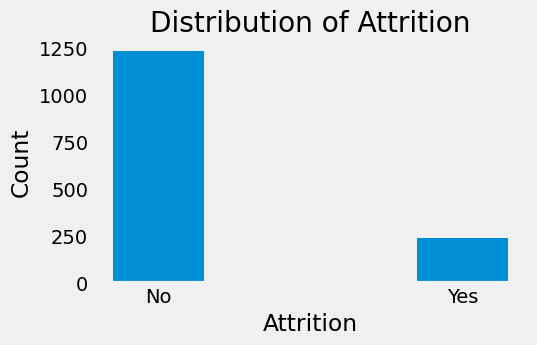

In [ ]:
# Plot barplot to visualize balance/imbalance
attrition_counts = hr_df['attrition'].value_counts()
plt.figure(figsize= (5,3))
plt.bar(attrition_counts.index, attrition_counts.values, width= 0.3, label= attrition_counts.values)
plt.xlabel('Attrition')
plt.ylabel('Count')
plt.title('Distribution of Attrition')
plt.grid(False)
plt.show()

If there is any imbalance in the dataset then a few techniques can be utilised (optional):
1. SMOTE
2. Cross Validation
3. Regularizing the model's parameters

###Plot pairplot

**Exercise 6: Visualize the relationships between the predictor variables and the target variable using a pairplot [0.5 Mark]**

**Hint:** Use sns.pairplot

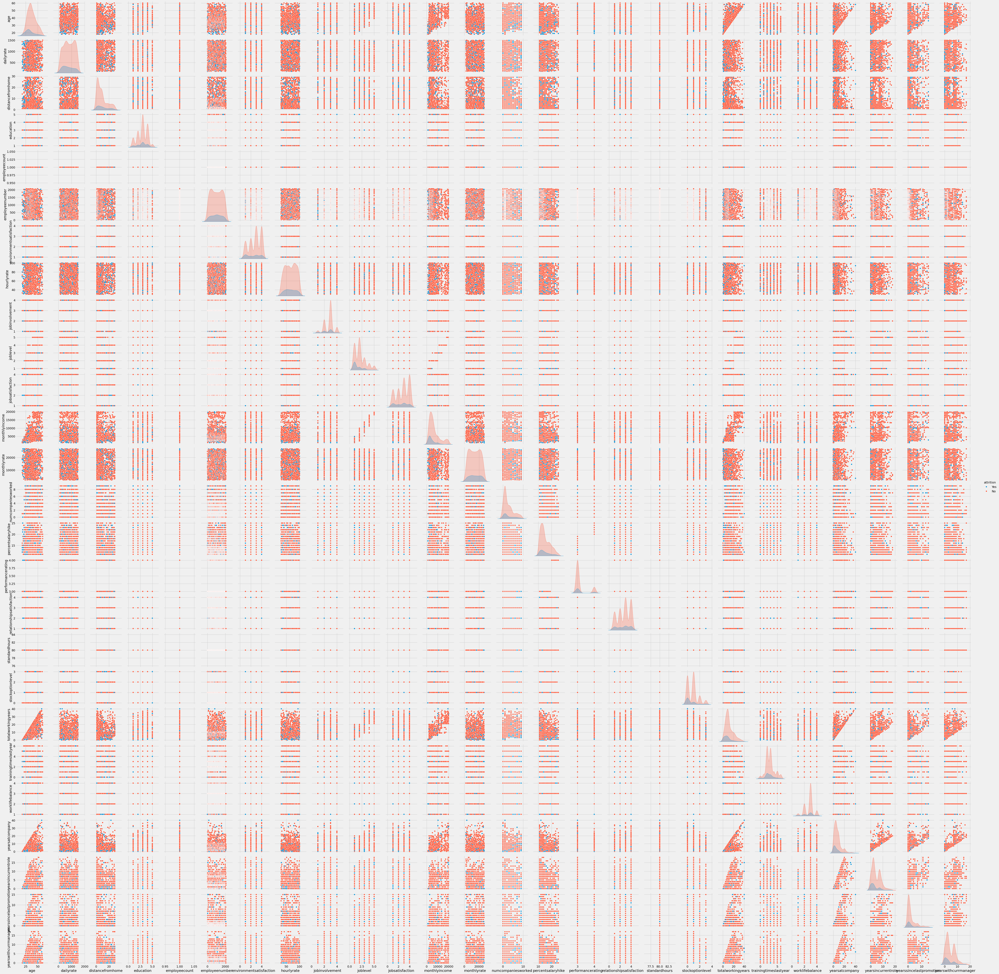

In [ ]:
# Visualize a pairplot with relevant features
sns.pairplot(hr_df, hue= 'attrition')
plt.show()

### Explore Correlation

- Plotting the Heatmap

**Exercise 7: Visualize the correlation among IBM employee attrition numerical features using a heatmap [0.5 Mark]**

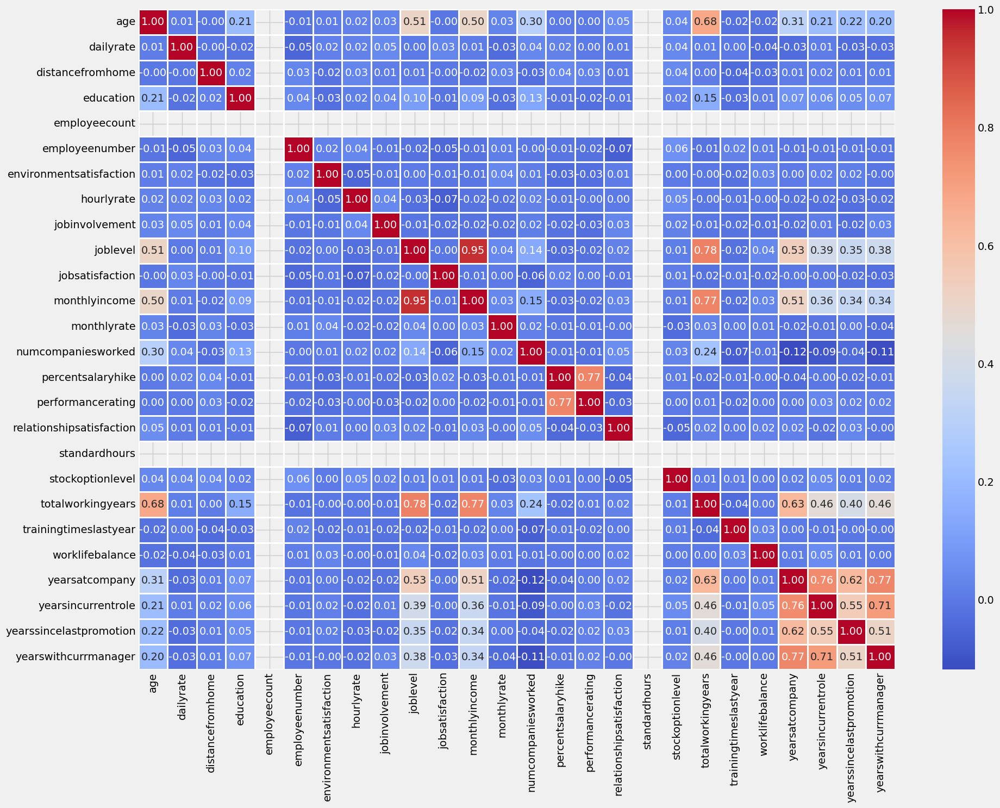

In [ ]:
# Visualize heatmap
corr_matrix = hr_df[numerical_col].corr()
plt.figure(figsize= (20,15))
sns.heatmap(corr_matrix, annot= True, cmap= 'coolwarm', fmt= '.2f', linewidth= 1)
plt.show()

Comment on the observations made with the pairplot and heatmap

### Observations:

### Correlations
- age has postive correlation with
    - joblevel
    - monthlyincome
    - numcompaniesworked
    - totalworkingyears

- job level and montlyincome has postive coorelation with
    - yearsatcompany
    - yearincurrrole
    - yearswithcurrmanager


- Good postive Correlation between
    - yearsatcompany
    - yearincurrrole
    - yearswithcurrmanager
    - yearssincelastpromotion

- Poor Correlations:
    - dailyrate
    - dustancefromhome
    - education
    - employeecount
    - employeenumber
    - environmentsatisfaction
    - hourlyrate
    - jobinvolvement
    - jobsatisfaction
    - monthlyrate
    - percentsalaryhike
    - performancerating
    - relationshipsatisfaction
    - standardhours
    - stockoptionlevel
    - trainingtimeslastyear
    - worklifebalance

### Other inferences
 - employeecount and standardhours doesn't show-up in correlation plot, so can be skipped in classification activity

# Part-B

### Preparing the test feature space
* Remove outliers if any
* Handle the categorical feature if required
* Other processing steps can also be followed.

In [ ]:
# YOUR CODE HERE
def remove_outliers(column):
    lower_bound = column.quantile(0.25)
    upper_bound = column.quantile(0.75)
    return column[(column >= lower_bound) & (column <= upper_bound)]

temp_df = hr_df.copy()
temp_df = temp_df[numerical_col].apply(remove_outliers)

Optional:
Use `Hyperopt`, a hyperparameter tuning technique to identify the best set of parameters.

In the notebook, data processing is done separately for different models.
Considering the fact that different models may require data in different format and in turn different processes may be followed to process the data.

If the processing steps followed for the models are same, data processing can also be done once.

## Apply CatBoost

Catboost was released in 2017 by Yandex, showing, by their benchmark to be faster in prediction, better in accuracy, and easier to use for categorical data across a series of GBDT tasks. Additional capabilities of catboost include plotting feature interactions and object (row) importance.

[Here](https://catboost.ai/en/docs/) is the official documentation of CatBoost

### Data Processing for CatBoost

**Exercise 8: Data processing for CatBoost [1 Mark]**
* **Copy the dataframe that was created after removing the outliers**
* **Handle the categorical features if required**
* **Create target column and feature space**

**Hint:** Column containing the information on attrition will be the target column.

In [ ]:
# Copy the data
new_df = hr_df.copy()

from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
enc = LabelEncoder()
ordi_enc = OrdinalEncoder()
new_df['attrition'] = enc.fit_transform(new_df['attrition'])
new_df[categorical_col] = ordi_enc.fit_transform(new_df[categorical_col])

In [ ]:
# Target Column
y = new_df['attrition']
y.shape

(1470,)

In [ ]:
new_df.head()

,age,attrition,businesstravel,dailyrate,department,distancefromhome,education,educationfield,employeecount,employeenumber,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,monthlyrate,numcompaniesworked,over18,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
0,41,1.0,2.0,1102,2.0,1,2,1.0,1,1,2,0.0,94,3,2,7.0,4,2.0,5993,19479,8,0.0,1.0,11,3,1,80,0,8,0,1,6,4,0,5
1,49,0.0,1.0,279,1.0,8,1,1.0,1,2,3,1.0,61,2,2,6.0,2,1.0,5130,24907,1,0.0,0.0,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1.0,2.0,1373,1.0,2,2,4.0,1,4,4,1.0,92,2,1,2.0,3,2.0,2090,2396,6,0.0,1.0,15,3,2,80,0,7,3,3,0,0,0,0
3,33,0.0,1.0,1392,1.0,3,4,1.0,1,5,4,0.0,56,3,1,6.0,3,1.0,2909,23159,1,0.0,1.0,11,3,3,80,0,8,3,3,8,7,3,0
4,27,0.0,2.0,591,1.0,2,1,3.0,1,7,1,1.0,40,3,1,2.0,2,1.0,3468,16632,9,0.0,0.0,12,3,4,80,1,6,3,3,2,2,2,2


In [ ]:
# Feature Space
X = new_df.drop(columns= ['attrition', 'employeecount', 'employeenumber', 'over18'], axis= 1)

In [ ]:
# create train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size= 0.2,
                                                    random_state = 0)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1176, 31), (294, 31), (1176,), (294,))

### Model Definition

**Exercise 9: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use CatBoostClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model. Refer [here](https://catboost.ai/en/docs/concepts/speed-up-training) to see some ways to speedup CatBoost training.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
# Create CatBoost model
catboost = CatBoostClassifier(iterations = 100,
                              learning_rate = 0.05,
                              depth = 6,
                              class_weights = [1, 5.2],
                              subsample = 0.8,
                              colsample_bylevel = 0.7,
                              )

In [ ]:
# Model training
catboost.fit(X_train, y_train)

0:	learn: 0.6846353	total: 9.7ms	remaining: 960ms
1:	learn: 0.6705670	total: 15.6ms	remaining: 764ms
2:	learn: 0.6574174	total: 18ms	remaining: 581ms
3:	learn: 0.6431033	total: 20.1ms	remaining: 483ms
4:	learn: 0.6299013	total: 22.2ms	remaining: 423ms
5:	learn: 0.6157372	total: 25ms	remaining: 391ms
6:	learn: 0.6018933	total: 27.1ms	remaining: 360ms
7:	learn: 0.5938928	total: 30.1ms	remaining: 346ms
8:	learn: 0.5859117	total: 32.8ms	remaining: 331ms
9:	learn: 0.5752933	total: 34.7ms	remaining: 313ms
10:	learn: 0.5657218	total: 37.7ms	remaining: 305ms
11:	learn: 0.5586624	total: 44.3ms	remaining: 325ms
12:	learn: 0.5522308	total: 46.3ms	remaining: 310ms
13:	learn: 0.5455437	total: 48.1ms	remaining: 296ms
14:	learn: 0.5382863	total: 50.1ms	remaining: 284ms
15:	learn: 0.5341870	total: 52ms	remaining: 273ms
16:	learn: 0.5273439	total: 54.9ms	remaining: 268ms
17:	learn: 0.5181178	total: 56.8ms	remaining: 259ms
18:	learn: 0.5124163	total: 58.5ms	remaining: 249ms
19:	learn: 0.5057689	total: 6

### Model performance

In [ ]:
# Model performance on all sets
from sklearn.metrics import precision_score, recall_score
cat_train_pred = catboost.predict(X_train)
cat_test_pred = catboost.predict(X_test)

# Accuracy and other metrics
print('CatBoost Accuracy metrics')
print(f'train_accuracy: {accuracy_score(y_train, cat_train_pred)}')
print(f'train_precision: {precision_score(y_train, cat_train_pred)}')
print(f'train_recall: {recall_score(y_train, cat_train_pred)}')
print(f'train_f1_score: {f1_score(y_train, cat_train_pred)}')
print()
print(f'test_accuracy: {accuracy_score(y_test, cat_test_pred)}')
print(f'test_precision: {precision_score(y_test, cat_test_pred)}')
print(f'test_recall: {recall_score(y_test, cat_test_pred)}')
print(f'test_f1_score: {f1_score(y_test, cat_test_pred)}')

train_confusion = confusion_matrix(y_train, cat_train_pred)
test_confusion = confusion_matrix(y_test, cat_test_pred)
print('\ntrain_confusion_matrix\n', train_confusion)
print('\ntest_confusion_matrix\n', test_confusion)

CatBoost Accuracy metrics
train_accuracy: 0.9438775510204082
train_precision: 0.7606837606837606
train_recall: 0.9468085106382979
train_f1_score: 0.8436018957345972

test_accuracy: 0.8537414965986394
test_precision: 0.56
test_recall: 0.5714285714285714
test_f1_score: 0.5656565656565656

train_confusion_matrix
 [[932  56]
 [ 10 178]]

test_confusion_matrix
 [[223  22]
 [ 21  28]]


## Apply XGBoost

XGBoost is a workhorse gradient boosted decision tree algorithm. Its been around since 2014 and has come to dominate the Kaggle and data science community. XGB introduced gradient boosting where new models are fit to the residuals of prior models and then added together, using a gradient descent algorithm to minimize the loss.

Read [here](https://xgboost.readthedocs.io/en/stable/parameter.html) on XGBoost parameters.

Refer [here](https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.XGBClassifier) for the official documentation of XGBoost classifier.

### Data Processing for XGBoost


**Exercise 10: Data Processing for XGBoost [1 Mark]**
* **Copy the dataframe after the outliers were removed.**
* **Handle the categorical features if required**
* **Create target column and feature space**

In [ ]:
# Copy dataframe
new_df = hr_df.copy()

**Hint:** Use pd.get_dummies

In [ ]:
# Handling categorical features
dummy_df = pd.get_dummies(new_df[categorical_col], dtype= int)
dummy_df.head()

,attrition_No,attrition_Yes,businesstravel_Non-Travel,businesstravel_Travel_Frequently,businesstravel_Travel_Rarely,department_Human Resources,department_Research & Development,department_Sales,educationfield_Human Resources,educationfield_Life Sciences,educationfield_Marketing,educationfield_Medical,educationfield_Other,educationfield_Technical Degree,gender_Female,gender_Male,jobrole_Healthcare Representative,jobrole_Human Resources,jobrole_Laboratory Technician,jobrole_Manager,jobrole_Manufacturing Director,jobrole_Research Director,jobrole_Research Scientist,jobrole_Sales Executive,jobrole_Sales Representative,maritalstatus_Divorced,maritalstatus_Married,maritalstatus_Single,over18_Y,overtime_No,overtime_Yes
0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1
1,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0
2,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1
3,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1
4,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0


In [ ]:
# Concat the dummy variables to actual dataframe and remove initial categorical columns
df1 = new_df.drop(columns = categorical_col, axis= 1)
df2 = dummy_df.drop(columns= 'attrition_No', axis= 1)

final_df = pd.concat([df1, df2], axis= 1)
final_df.head()

,age,dailyrate,distancefromhome,education,employeecount,employeenumber,environmentsatisfaction,hourlyrate,jobinvolvement,joblevel,jobsatisfaction,monthlyincome,monthlyrate,numcompaniesworked,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager,attrition_Yes,businesstravel_Non-Travel,businesstravel_Travel_Frequently,businesstravel_Travel_Rarely,department_Human Resources,department_Research & Development,department_Sales,educationfield_Human Resources,educationfield_Life Sciences,educationfield_Marketing,educationfield_Medical,educationfield_Other,educationfield_Technical Degree,gender_Female,gender_Male,jobrole_Healthcare Representative,jobrole_Human Resources,jobrole_Laboratory Technician,jobrole_Manager,jobrole_Manufacturing Director,jobrole_Research Director,jobrole_Research Scientist,jobrole_Sales Executive,jobrole_Sales Representative,maritalstatus_Divorced,maritalstatus_Married,maritalstatus_Single,over18_Y,overtime_No,overtime_Yes
0,41,1102,1,2,1,1,2,94,3,2,4,5993,19479,8,11,3,1,80,0,8,0,1,6,4,0,5,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1
1,49,279,8,1,1,2,3,61,2,2,2,5130,24907,1,23,4,4,80,1,10,3,3,10,7,1,7,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0
2,37,1373,2,2,1,4,4,92,2,1,3,2090,2396,6,15,3,2,80,0,7,3,3,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1
3,33,1392,3,4,1,5,4,56,3,1,3,2909,23159,1,11,3,3,80,0,8,3,3,8,7,3,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1
4,27,591,2,1,1,7,1,40,3,1,2,3468,16632,9,12,3,4,80,1,6,3,3,2,2,2,2,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0


When creating the dummy variables, the name of attrition column was changed, rename to 'attrition' again.

**Hint:** Use .rename

In [ ]:
# Rename target column
final_df = final_df.rename(columns = {'attrition_Yes': 'attrition'})

In [ ]:
# Feature Space
X = final_df.drop(columns = ['attrition', 'employeecount', 'employeenumber', 'over18_Y'], axis = 1)

# Targer label
y = final_df['attrition']

Xg_train, Xg_test, yg_train, yg_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.2,
                                                    random_state = 1)

# X_train.shape, X_test.shape, y_train.shape, y_test.shape

### Model Definition

**Exercise 11: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use XGBClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
# Create XGBoost classifier model
xgb = XGBClassifier(n_estimators = 500,
                    max_depth = 10,
                    min_child_weight = 15,
                    learning_rate = 0.4,
                    subsample = 0.8,
                    colsample_bytree = 0.5,
                    objective = 'binary:logistic',
                    scale_pos_weight = 5.2,
                    random_state = 0
                    )

In [ ]:
# Model training
xgb.fit(Xg_train, yg_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.4, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=15, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=0, ...)

### Model Performance

In [ ]:
# Model performance on all sets
from sklearn.metrics import precision_score, recall_score
xgb_train_pred = xgb.predict(Xg_train)
xgb_test_pred = xgb.predict(Xg_test)

# Accuracy and other metrics
print('XGBoost Accuracy metrics')
print(f'train_accuracy: {accuracy_score(yg_train, xgb_train_pred)}')
print(f'train_precision: {precision_score(yg_train, xgb_train_pred)}')
print(f'train_recall: {recall_score(yg_train, xgb_train_pred)}')
print(f'train_f1_score: {f1_score(yg_train, xgb_train_pred)}')
print()
print(f'test_accuracy: {accuracy_score(yg_test, xgb_test_pred)}')
print(f'test_precision: {precision_score(yg_test, xgb_test_pred)}')
print(f'test_recall: {recall_score(yg_test, xgb_test_pred)}')
print(f'test_f1_score: {f1_score(yg_test, xgb_test_pred)}')

train_confusion = confusion_matrix(yg_train, xgb_train_pred)
test_confusion = confusion_matrix(yg_test, xgb_test_pred)
print('\ntrain_confusion_matrix\n', train_confusion)
print('\ntest_confusion_matrix\n', test_confusion)

XGBoost Accuracy metrics
train_accuracy: 0.9991496598639455
train_precision: 0.9944444444444445
train_recall: 1.0
train_f1_score: 0.9972144846796658

test_accuracy: 0.8537414965986394
test_precision: 0.6363636363636364
test_recall: 0.603448275862069
test_f1_score: 0.6194690265486726

train_confusion_matrix
 [[996   1]
 [  0 179]]

test_confusion_matrix
 [[216  20]
 [ 23  35]]


In [ ]:
from sklearn.metrics import classification_report

train_xgb_report = classification_report(yg_train, xgb_train_pred)
test_xgb_report = classification_report(yg_test, xgb_test_pred)

print(test_xgb_report)

              precision    recall  f1-score   support

           0       0.89      0.92      0.90       236
           1       0.62      0.53      0.57        58

    accuracy                           0.84       294
   macro avg       0.75      0.73      0.74       294
weighted avg       0.84      0.84      0.84       294



In [ ]:
roc_auc_score(yg_test, xgb_test_pred)

0.7139830508474576

## Apply LightGBM (Optional)

LightGBM is an open-source GBDT framework created by Microsoft as a fast and scalable alternative to XGB and GBM. By default LightGBM will train a Gradient Boosted Decision Tree (GBDT), but it also supports random forests, Dropouts meet Multiple Additive Regression Trees (DART), and Gradient Based One-Side Sampling (Goss).

To know more about LightGBM parameters, refer [here](https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html#lightgbm.LGBMClassifier).

### Feature Engineering for LightGBM

In [ ]:
## Following the same procedure as followed in XGBoost

# Copy the dataframe
new_df = hr_df.copy()

# Handling categorical features
dummy_lgbm = pd.get_dummies(new_df[categorical_col], dtype= int)

# Concat the dummy variables to actual dataframe and remove initial categorical columns
df1 = new_df.drop(columns = categorical_col, axis = 1)
df2 = dummy_lgbm.drop(columns = 'attrition_No', axis = 1)

final_df = pd.concat([df1, df2], axis= 1)

# Rename target column
final_df = final_df.rename(columns = {'attrition_Yes': 'attrition'})

# Features Space
X = final_df.drop(columns = ['attrition', 'employeecount', 'employeenumber', 'over18_Y'], axis = 1)

# Target Label
y = final_df['attrition']

Xl_train, Xl_test, yl_train, yl_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.2,
                                                    random_state = 1)

### Model Definition

**Hint:**
* Use LGBMClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
# Create LightGBM classifier model
lgbm = LGBMClassifier(boosting_type = 'gbdt',
                      num_leaves = 16,
                      max_depth = 25,
                      learning_rate = 0.2,
                      n_estimators = 100,
                      min_child_weight = 0,
                      scale_pos_weight = 5.2,
                      objective = 'binary',
                      subsample = 0.7,
                      colsample_bytree = 0.5,
                      random_state = 1,
                      )

In [ ]:
# Model training
lgbm.fit(Xl_train, yl_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 179, number of negative: 997
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1161
[LightGBM] [Info] Number of data points in the train set: 1176, number of used features: 51
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.152211 -> initscore=-1.717365
[LightGBM] [Info] Start training from score -1.717365


LGBMClassifier(colsample_bytree=0.5, learning_rate=0.2, max_depth=25,
               min_child_weight=0, num_leaves=16, objective='binary',
               random_state=1, scale_pos_weight=5.2, subsample=0.7)

### Model performance

In [ ]:
# Model performance on all sets
from sklearn.metrics import precision_score, recall_score
lgbm_train_pred = lgbm.predict(Xl_train)
lgbm_test_pred = lgbm.predict(Xl_test)

# Accuracy and other metrics
print('LightGBM Accuracy metrics')
print(f'train_accuracy: {accuracy_score(yl_train, lgbm_train_pred)}')
print(f'train_precision: {precision_score(yl_train, lgbm_train_pred)}')
print(f'train_recall: {recall_score(yl_train, lgbm_train_pred)}')
print(f'train_f1_score: {f1_score(yl_train, lgbm_train_pred)}')
print()
print(f'test_accuracy: {accuracy_score(yl_test, lgbm_test_pred)}')
print(f'test_precision: {precision_score(yl_test, lgbm_test_pred)}')
print(f'test_recall: {recall_score(yl_test, lgbm_test_pred)}')
print(f'test_f1_score: {f1_score(yl_test, lgbm_test_pred)}')

train_confusion = confusion_matrix(yl_train, lgbm_train_pred)
test_confusion = confusion_matrix(yl_test, lgbm_test_pred)
print('\ntrain_confusion_matrix\n', train_confusion)
print('\ntest_confusion_matrix\n', test_confusion)

LightGBM Accuracy metrics
train_accuracy: 1.0
train_precision: 1.0
train_recall: 1.0
train_f1_score: 1.0

test_accuracy: 0.8367346938775511
test_precision: 0.625
test_recall: 0.43103448275862066
test_f1_score: 0.5102040816326531

train_confusion_matrix
 [[997   0]
 [  0 179]]

test_confusion_matrix
 [[221  15]
 [ 33  25]]


## Results

**Exercise 12: Create a dataframe of XGBoost results and CatBoost results and display them [0.5 Mark]**

**Hint:** Use pd.DataFrame

In [ ]:
# Create a dataframe for computed metrics for different models
catboost_metrics = [accuracy_score(y_test, cat_test_pred), precision_score(y_test, cat_test_pred), recall_score(y_test, cat_test_pred), f1_score(y_test, cat_test_pred)]
xgboost_metrics = [accuracy_score(yg_test, xgb_test_pred), precision_score(yg_test, xgb_test_pred), recall_score(yg_test, xgb_test_pred), f1_score(yg_test, xgb_test_pred)]
lgbm_metrics =[accuracy_score(yl_test, lgbm_test_pred), precision_score(yl_test, lgbm_test_pred), recall_score(yl_test, lgbm_test_pred), f1_score(yl_test, lgbm_test_pred)]

metric_values = ['accuracy', 'precision', 'recall', 'f1_score']

metric_df = pd.DataFrame({'Metric': metric_values,
                          'CatBoost': catboost_metrics,
                          'XGBoost': xgboost_metrics,
                          'LightGBM': lgbm_metrics})
metric_df

,Metric,CatBoost,XGBoost,LightGBM
0,accuracy,0.853741,0.853741,0.836735
1,precision,0.560000,0.636364,0.625000
2,recall,0.571429,0.603448,0.431034
3,f1_score,0.565657,0.619469,0.510204


### After removing outliers

In [ ]:
lower_bound = 0.25
upper_bound = 0.75

# Calculate the percentile values for each feature
lower_percentiles = hr_df[numerical_col].quantile(lower_bound)
upper_percentiles = hr_df[numerical_col].quantile(upper_bound)

# Replace values below the lower bound with the lower bound and above the upper bound with the upper bound
# Now 'trimmed_data' contains the dataset with outliers handled by trimming
trimmed_data = hr_df.clip(lower=lower_percentiles, upper=upper_percentiles, axis=1)

#final data contains categorical values retained and numerical values with outlier treatment.
final_data = pd.concat([trimmed_data.select_dtypes(include=['number']), hr_df.select_dtypes(exclude=['number'])], axis=1)

In [ ]:
new_df = final_data.copy()

from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
enc = LabelEncoder()
ordi_enc = OrdinalEncoder()
new_df['attrition'] = enc.fit_transform(new_df['attrition'])
new_df[categorical_col] = ordi_enc.fit_transform(new_df[categorical_col])

# Target Column
y = new_df['attrition']
y.shape

# Feature Space
X = new_df.drop(columns= ['attrition', 'employeecount', 'employeenumber', 'over18'], axis= 1)

# create train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size= 0.2,
                                                    random_state = 0)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

# Create CatBoost model
catboost = CatBoostClassifier(iterations = 200,
                              learning_rate = 0.2,
                              depth = 6,
                              class_weights = [1, 5.2],
                              subsample = 0.8,
                              colsample_bylevel = 0.7,
                              loss_function = 'Logloss',
                              eval_metric = 'F1'
                              )

# Model training
catboost.fit(X_train, y_train)

# Model performance on all sets
from sklearn.metrics import precision_score, recall_score
cat_train_pred = catboost.predict(X_train)
cat_test_pred = catboost.predict(X_test)

# Accuracy and other metrics
print('CatBoost Accuracy metrics')
print(f'train_accuracy: {accuracy_score(y_train, cat_train_pred)}')
print(f'train_precision: {precision_score(y_train, cat_train_pred)}')
print(f'train_recall: {recall_score(y_train, cat_train_pred)}')
print(f'train_f1_score: {f1_score(y_train, cat_train_pred)}')
print()
print(f'test_accuracy: {accuracy_score(y_test, cat_test_pred)}')
print(f'test_precision: {precision_score(y_test, cat_test_pred)}')
print(f'test_recall: {recall_score(y_test, cat_test_pred)}')
print(f'test_f1_score: {f1_score(y_test, cat_test_pred)}')

train_confusion = confusion_matrix(y_train, cat_train_pred)
test_confusion = confusion_matrix(y_test, cat_test_pred)
print('\ntrain_confusion_matrix\n', train_confusion)
print('\ntest_confusion_matrix\n', test_confusion)

0:	learn: 0.6857143	total: 4.92ms	remaining: 979ms
1:	learn: 0.7691667	total: 13.1ms	remaining: 1.29s
2:	learn: 0.7913043	total: 22.4ms	remaining: 1.47s
3:	learn: 0.7880423	total: 33.6ms	remaining: 1.65s
4:	learn: 0.8232190	total: 41.5ms	remaining: 1.62s
5:	learn: 0.8333676	total: 48.5ms	remaining: 1.57s
6:	learn: 0.8394859	total: 56.2ms	remaining: 1.55s
7:	learn: 0.8500204	total: 61.8ms	remaining: 1.48s
8:	learn: 0.8618489	total: 67.6ms	remaining: 1.43s
9:	learn: 0.8710307	total: 77.9ms	remaining: 1.48s
10:	learn: 0.8770316	total: 91.8ms	remaining: 1.58s
11:	learn: 0.8827078	total: 96.2ms	remaining: 1.51s
12:	learn: 0.8987265	total: 98.6ms	remaining: 1.42s
13:	learn: 0.9095137	total: 101ms	remaining: 1.33s
14:	learn: 0.9156772	total: 102ms	remaining: 1.26s
15:	learn: 0.9264338	total: 105ms	remaining: 1.21s
16:	learn: 0.9324785	total: 107ms	remaining: 1.15s
17:	learn: 0.9375939	total: 109ms	remaining: 1.1s
18:	learn: 0.9380637	total: 110ms	remaining: 1.05s
19:	learn: 0.9519808	total: 1

### XGBoost algorithm

In [ ]:
# Copy dataframe
new_df = final_data.copy()

# Handling categorical features
dummy_df = pd.get_dummies(new_df[categorical_col], dtype= int)
dummy_df.head()

# Concat the dummy variables to actual dataframe and remove initial categorical columns
df1 = new_df.drop(columns = categorical_col, axis= 1)
df2 = dummy_df.drop(columns= 'attrition_No', axis= 1)

final_df = pd.concat([df1, df2], axis= 1)
final_df.head()

# Rename target column
final_df = final_df.rename(columns = {'attrition_Yes': 'attrition'})

# Feature Space
X = final_df.drop(columns = ['attrition', 'employeecount', 'employeenumber', 'over18_Y'], axis = 1)

# Targer label
y = final_df['attrition']

Xg_train, Xg_test, yg_train, yg_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.2,
                                                    random_state = 1)

# X_train.shape, X_test.shape, y_train.shape, y_test.shape

# Create XGBoost classifier model
xgb = XGBClassifier(n_estimators = 500,
                    max_depth = 10,
                    min_child_weight = 15,
                    learning_rate = 0.4,
                    subsample = 0.8,
                    colsample_bytree = 0.5,
                    objective = 'binary:logistic',
                    scale_pos_weight = 5.2,
                    random_state = 0
                    )

# Model training
xgb.fit(Xg_train, yg_train)

# Model performance on all sets
from sklearn.metrics import precision_score, recall_score
xgb_train_pred = xgb.predict(Xg_train)
xgb_test_pred = xgb.predict(Xg_test)

# Accuracy and other metrics
print('XGBoost Accuracy metrics')
print(f'train_accuracy: {accuracy_score(yg_train, xgb_train_pred)}')
print(f'train_precision: {precision_score(yg_train, xgb_train_pred)}')
print(f'train_recall: {recall_score(yg_train, xgb_train_pred)}')
print(f'train_f1_score: {f1_score(yg_train, xgb_train_pred)}')
print()
print(f'test_accuracy: {accuracy_score(yg_test, xgb_test_pred)}')
print(f'test_precision: {precision_score(yg_test, xgb_test_pred)}')
print(f'test_recall: {recall_score(yg_test, xgb_test_pred)}')
print(f'test_f1_score: {f1_score(yg_test, xgb_test_pred)}')

train_confusion = confusion_matrix(yg_train, xgb_train_pred)
test_confusion = confusion_matrix(yg_test, xgb_test_pred)
print('\ntrain_confusion_matrix\n', train_confusion)
print('\ntest_confusion_matrix\n', test_confusion)

XGBoost Accuracy metrics
train_accuracy: 0.9974489795918368
train_precision: 0.9835164835164835
train_recall: 1.0
train_f1_score: 0.9916897506925207

test_accuracy: 0.7891156462585034
test_precision: 0.46
test_recall: 0.39655172413793105
test_f1_score: 0.425925925925926

train_confusion_matrix
 [[994   3]
 [  0 179]]

test_confusion_matrix
 [[209  27]
 [ 35  23]]


Reference reading:
1. https://machinelearningmastery.com/xgboost-for-imbalanced-classification/